In [2]:
%config InlineBackend.figure_format='retina'

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [60]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow import keras

# Загрузка данных

## Сенсоры

In [61]:
from datetime import datetime

Data = pd.read_csv("../Probe_Data/SensorsData_March.csv", index_col=0).iloc[::30, :-5]
Data.index = np.array(
    ([datetime.strptime(d[:-7], '%d.%m.%Y %H:%M:%S') for d in Data.index]),
    dtype='datetime64[ns]')

## Остановки

In [62]:
# StopLogs data

stops_data = pd.read_csv("../Probe_Data/Jan_to_Jun_StopLogs.csv")
stops_data['start_datetime'] = stops_data.start_datetime.astype('datetime64[ns]')
stops_data['end_datetime'] = stops_data.end_datetime.astype('datetime64[ns]')

In [63]:
March_Stops = stops_data[(stops_data.start_datetime >= "2020-03-01")
                         & (stops_data.end_datetime <= "2020-03-25")]

March_Stops.sort_values(by='start_datetime', inplace=True)

## Таргет

In [64]:
# Берем таргет из журнальных данных

Data['target'] = 0
Data['target_dscr'] = "Норма"

for start, end, dscr in March_Stops[np.invert(March_Stops.description.isin([
        "Технологические плановые : Межплавочный период",
        ]))]\
        [['start_datetime', 'end_datetime', 'description']].values:
    
    Data['target'][(Data.index >= start) & (Data.index <= end)] = 1
    Data['target_dscr'][(Data.index >= start) & (Data.index <= end)] = dscr

In [65]:
# Добавляем таргет по минимумам вибрации

Data["target"][(Data["Вибрация заднего подшипника двигателя (осевая)"] < 5.0)
             & (Data["Вибрация заднего подшипника двигателя (радиальная)"] < 5.0)] = 1

In [66]:
def SetShiftTarget(Data, delta):
    """
    Сдвигает изначальный таргет на delta шагов назад
    Шаг дискретизации по времени : 5 минут
    """
    Data["shift_target"] = Data.target.shift(-delta).values
    Data.fillna(0, inplace=True)
    Data["shift_target"] = Data.shift_target.astype(int)
    return Data

In [67]:
# Смещаем на 180 шагов (здесь минут) = 3 часа

Data = SetShiftTarget(Data, 180)

X = Data.drop(['target', 'target_dscr', 'shift_target'], axis=1)
y = Data['shift_target']

# Предобработка

## Нормализация

In [75]:
from sklearn.preprocessing import StandardScaler

# Normalize X
ss = StandardScaler()
X = pd.DataFrame(ss.fit_transform(X),
                 index=X.index,
                 columns=X.columns)


## Приведедение к изображению скользящим окном

In [76]:
from sklearn.feature_extraction.image import extract_patches

def get_XY_for_CNN(X, y, window_size = 60, window_step = 1):
    X_to_CNN = extract_patches(X.values, (window_size, X.shape[1]), extraction_step=window_step)
    y_to_CNN = extract_patches(y.values[window_size-1:], (1,), extraction_step=window_step)
    
    return X_to_CNN.reshape(-1, window_size, X.shape[1], 1), y_to_CNN.reshape(-1,)

In [77]:
X_to_CNN, y_to_CNN = get_XY_for_CNN(X, y)

In [78]:
X_to_CNN.shape

(34981, 60, 14, 1)

In [79]:
y_to_CNN.shape

(34981,)

In [18]:
from tqdm.notebook import tqdm

# Normalize X_to_CNN

for i, window in tqdm(enumerate(X_to_CNN), total=X_to_CNN.shape[0]):
    X_to_CNN[i] = (window - window.min())/window.max()


# Создание модели

In [95]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, BatchNormalization

n_hidden_convs = 3
num_filters = 10
filter_size = 5


def create_model(n_hidden_convs = n_hidden_convs,
                 n_hidden_filters = num_filters,
                 kernel_size = filter_size):

    model = Sequential()
    model.add(
        Conv2D(n_hidden_filters,
               kernel_size,
               padding='same',
               activation='relu',
               input_shape=X_to_CNN.shape[1:]))
    for i in range(n_hidden_convs):
        model.add(
            Conv2D(n_hidden_filters,
                   kernel_size,
                   padding='same',
                   activation='relu'))
    model.add(Conv2D(1, kernel_size, padding='same', activation='relu'))
    model.add(Flatten())
    model.add(Dense(2, activation='softmax'))

    model.compile(
        'adam',
        loss='categorical_crossentropy',
        metrics=['accuracy', 'AUC', 'binary_crossentropy'],
    )

    return model


# model = create_model()

model = Sequential([
    Conv2D(num_filters, filter_size, input_shape=X_to_CNN.shape[1:]),
    Conv2D(num_filters, filter_size),
    MaxPooling2D(2),
    Flatten(),
    Dense(2, activation='softmax'),
])

model.compile(
    'adam',
    loss='categorical_crossentropy',
    metrics=['accuracy', 'AUC'],
)

In [96]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_to_CNN, y_to_CNN, test_size=0.3, shuffle=False)
# X_train, X_test = X_to_CNN[20000:], X_to_CNN[:20000]
# y_train, y_test = y_to_CNN[20000:], y_to_CNN[:20000]

## Обучение

In [97]:
from tensorflow.keras.utils import to_categorical

history = model.fit(X_train,
                    to_categorical(y_train),
                    epochs=50,
                    validation_data=(X_test, to_categorical(y_test)),
                    shuffle=False)

Epoch 1/50
766/766 [==============================] - 11s 15ms/step - loss: 0.5403 - accuracy: 0.9088 - auc: 0.9303 - val_loss: 1.2130 - val_accuracy: 0.5623 - val_auc: 0.6709
Epoch 2/50
766/766 [==============================] - 12s 16ms/step - loss: 0.4798 - accuracy: 0.9157 - auc: 0.9551 - val_loss: 0.7032 - val_accuracy: 0.9278 - val_auc: 0.9345
Epoch 3/50
766/766 [==============================] - 11s 15ms/step - loss: 0.5066 - accuracy: 0.9203 - auc: 0.9511 - val_loss: 2.3616 - val_accuracy: 0.6311 - val_auc: 0.6556
Epoch 4/50
766/766 [==============================] - 11s 14ms/step - loss: 0.7578 - accuracy: 0.9146 - auc: 0.9445 - val_loss: 0.4678 - val_accuracy: 0.9019 - val_auc: 0.9269
Epoch 5/50
766/766 [==============================] - 11s 14ms/step - loss: 0.5871 - accuracy: 0.9185 - auc: 0.9477 - val_loss: 0.2822 - val_accuracy: 0.9459 - val_auc: 0.9340
Epoch 6/50
766/766 [==============================] - 12s 16ms/step - loss: 0.4036 - accuracy: 0.9191 - auc: 0.9486 - va

## Learning Curve

dict_keys(['loss', 'accuracy', 'auc', 'val_loss', 'val_accuracy', 'val_auc'])


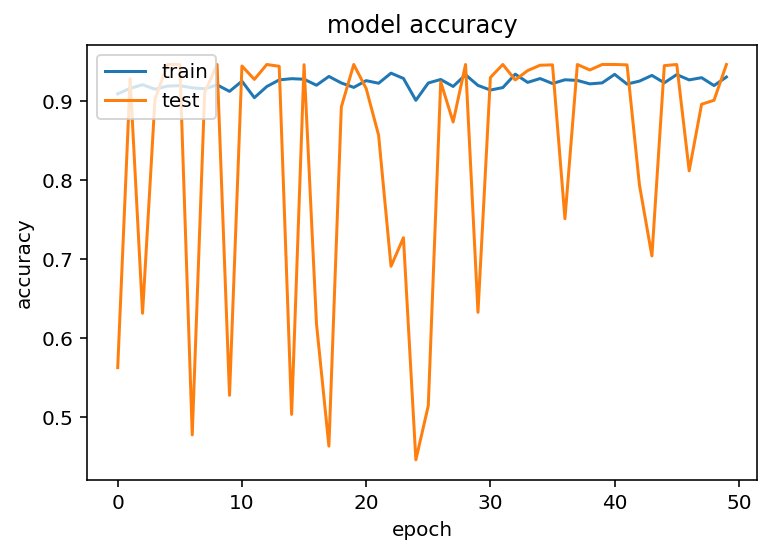

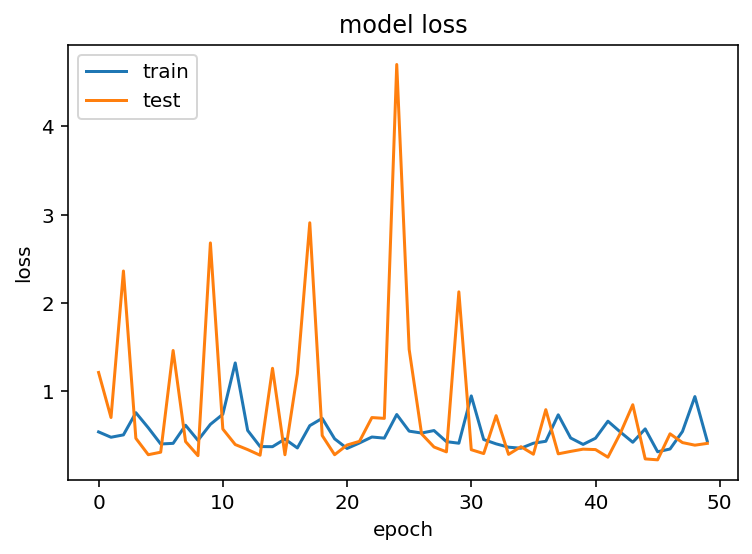

In [100]:
# list all data in history
print(history.history.keys())

# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Визуализация предсказаний

In [101]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = Data.columns[12]
sens_name_2 = Data.columns[13]

Sens_1 = Data[sens_name_1].values
Sens_2 = Data[sens_name_2].values

Target = Data.target.values * max(Sens_1.max(), Sens_2.max())
Target_DSCR = Data.target_dscr.values

TrainPreds = model.predict(X_train)[:,1] * max(Sens_1.max(), Sens_2.max())
TestPreds = model.predict(X_test)[:,1] * max(Sens_1.max(), Sens_2.max())

fig = go.Figure()
fig.add_trace(go.Scatter(x=Data.index, y=Sens_1, name="Вибрация ЗПД (осев.)"))
fig.add_trace(go.Scatter(x=Data.index, y=Sens_2, name="Вибрация ЗПД (рад.)"))
fig.add_trace(go.Scatter(x=Data.index, y=Target, text=Target_DSCR, name="Остановки"))

fig.add_trace(go.Scatter(x=Data.index[:len(TrainPreds)], y=TrainPreds,  name="Train Preds"))
fig.add_trace(go.Scatter(x=Data.index[len(TrainPreds):], y=TestPreds,  name="Test Preds"))


#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("March_Stops_Example.html", config=config)